# Task 1 – Inductive biases (STL-10)
Runtime → Change runtime type → **T4 GPU**. Needs `pa1_code.zip` in My Drive.

In [2]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

# Upload pa1_code.zip to the root of "My Drive" first.
!rm -rf /content/pa1 && unzip -q -o /content/drive/MyDrive/pa1_code.zip -d /content/
DRIVE = "/content/drive/MyDrive/PA1_v2"      # all new results go here (separate from old runs)
!mkdir -p {DRIVE}
# results/ lives directly on Drive (survives disconnects)
!mkdir -p {DRIVE}/task1_results
!rm -rf /content/pa1/task1/results && ln -s {DRIVE}/task1_results /content/pa1/task1/results
%cd /content/pa1/task1

Mounted at /content/drive
/content/pa1/task1


In [3]:
!pip install -q open_clip_torch umap-learn
import torch
print("CUDA:", torch.cuda.is_available(), torch.cuda.get_device_name(0) if torch.cuda.is_available() else "")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 58.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 4.9 MB/s eta 0:00:00
CUDA: True Tesla T4


## 1. Train/val split and the 500-image test subset

In [4]:
!python data/make_subset.py --config configs/config.yaml

100% 2.64G/2.64G [06:53<00:00, 6.38MB/s]
Train split: 4000 images | Val split: 1000 images
Class-balanced test subset: 500 images
Saved indices to ./results/subset_indices.json


## 2. Cue conflicts (AdaIN decoder; weights download automatically)
Look at the contact sheets **before** step 3. If an image must be rejected by eye, add its candidate id (shown under each image) to `cue_conflict.manual_rejections` in `configs/config.yaml` and re-run this cell.

In [5]:
!python data/make_cue_conflicts.py --config configs/config.yaml

  downloading https://github.com/naoto0804/pytorch-AdaIN/releases/download/v0.0.0/vgg_normalised.pth -> ./weights/vgg_normalised.pth
  downloading https://github.com/naoto0804/pytorch-AdaIN/releases/download/v0.0.0/decoder.pth -> ./weights/decoder.pth
AdaIN backend in use: adain_decoder
Class pairs (unordered): [('monkey', 'ship'), ('cat', 'monkey'), ('airplane', 'truck'), ('bird', 'ship'), ('bird', 'dog')]
  monkey->ship: accepted 20/20 after 21 candidates
  ship->monkey: accepted 20/20 after 20 candidates
  cat->monkey: accepted 20/20 after 21 candidates
  monkey->cat: accepted 20/20 after 20 candidates
  airplane->truck: accepted 20/20 after 20 candidates
  truck->airplane: accepted 20/20 after 20 candidates
  bird->ship: accepted 20/20 after 20 candidates
  ship->bird: accepted 20/20 after 20 candidates
  bird->dog: accepted 20/20 after 20 candidates
  dog->bird: accepted 20/20 after 20 candidates
Accepted 200 cue-conflict images, rejected 2 ({'R1_degenerate': 0, 'R2_no_texture_tra

results/cue_conflicts/contact_sheets/airplane_to_truck.png


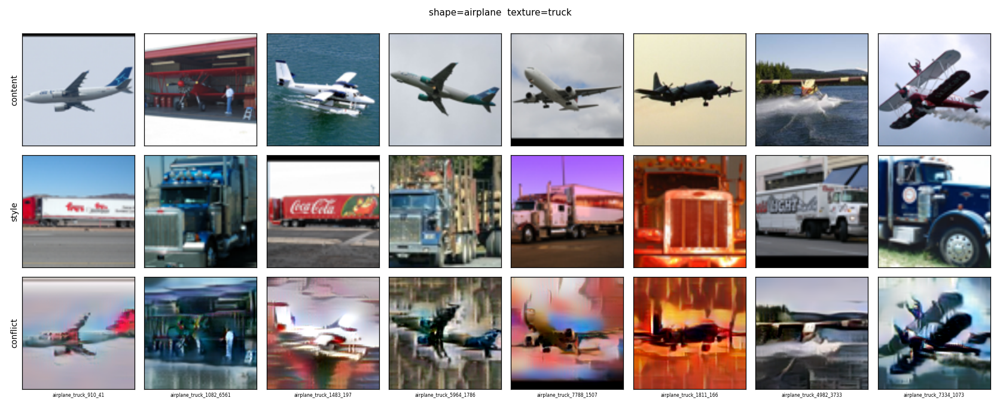

results/cue_conflicts/contact_sheets/bird_to_dog.png


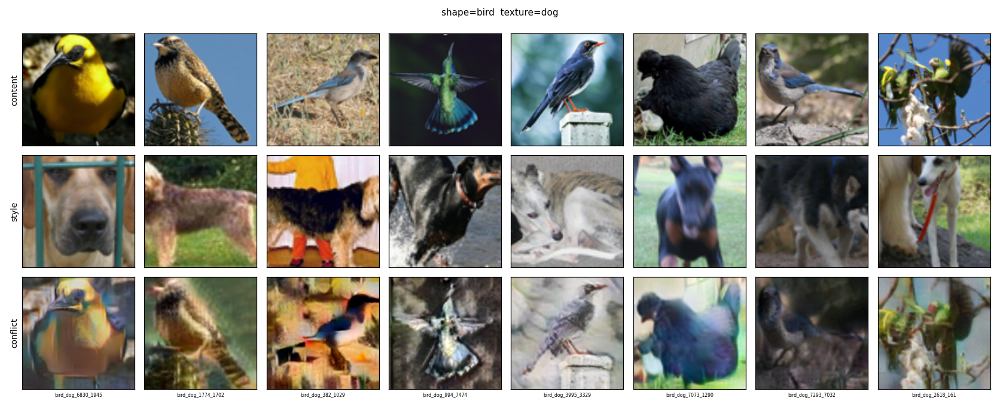

results/cue_conflicts/contact_sheets/bird_to_ship.png


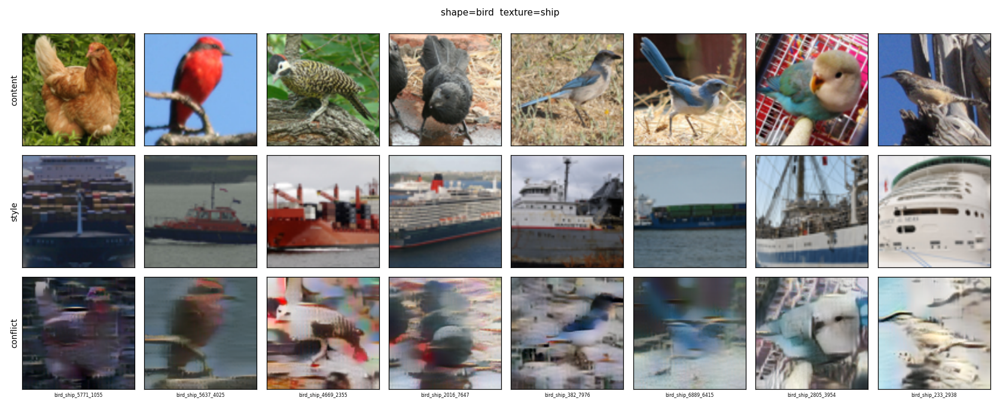

results/cue_conflicts/contact_sheets/cat_to_monkey.png


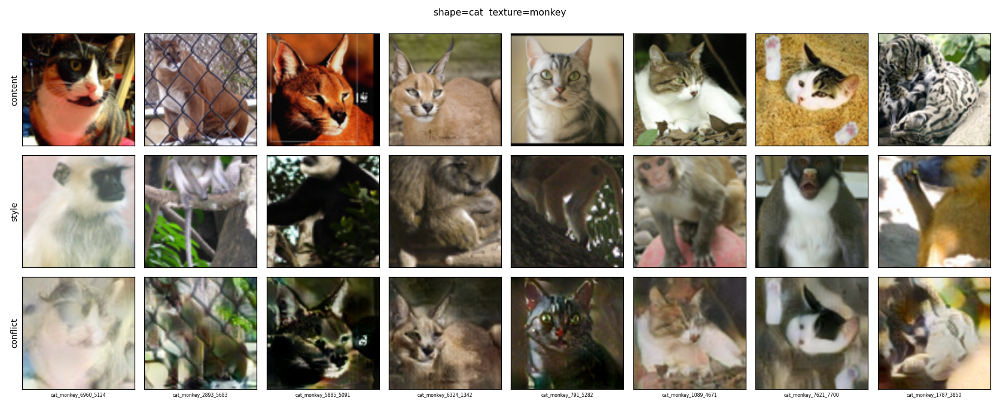

results/cue_conflicts/contact_sheets/dog_to_bird.png


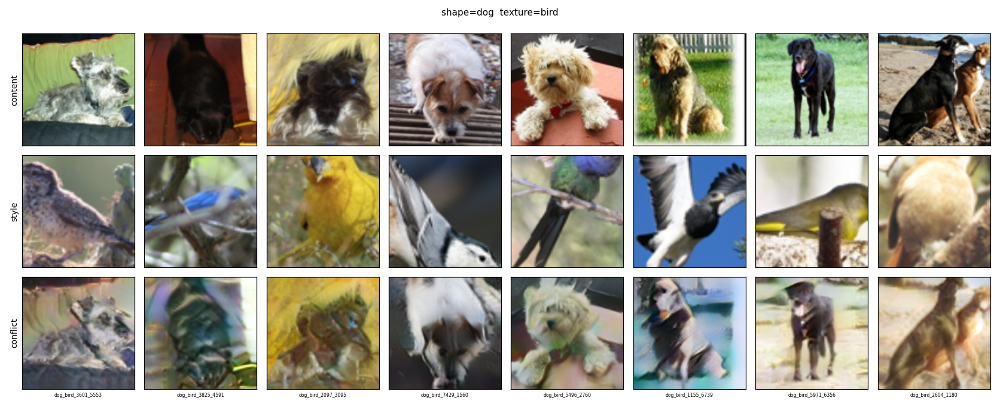

results/cue_conflicts/contact_sheets/monkey_to_cat.png


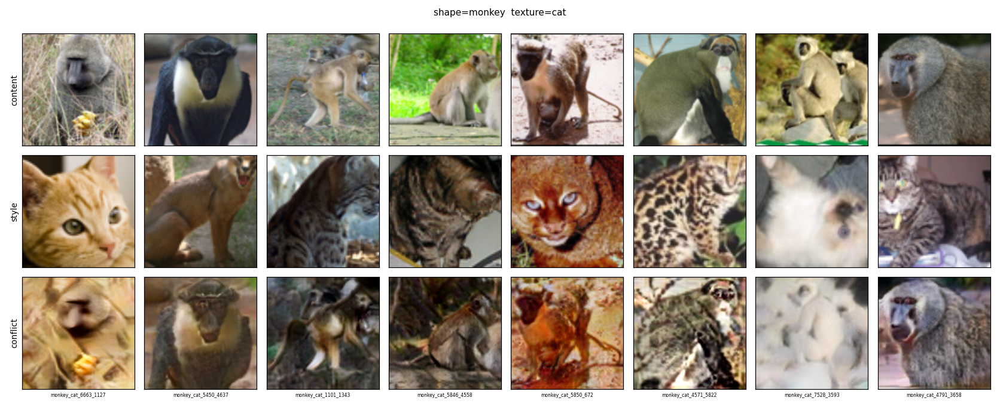

results/cue_conflicts/contact_sheets/monkey_to_ship.png


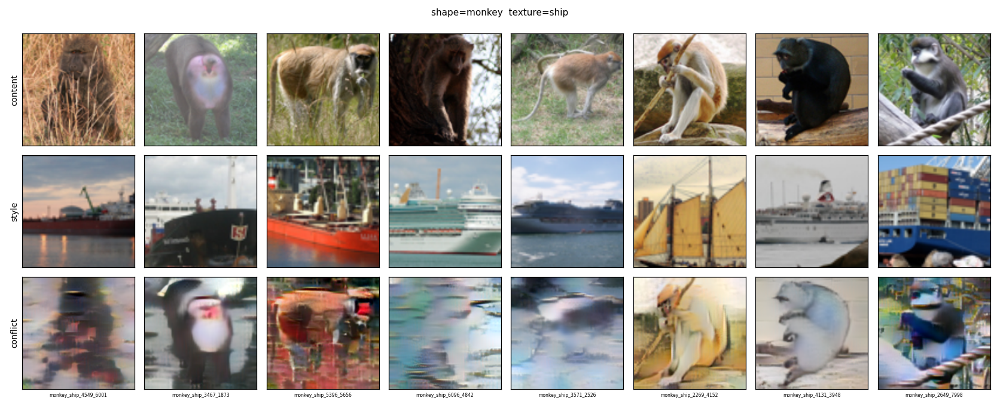

results/cue_conflicts/contact_sheets/ship_to_bird.png


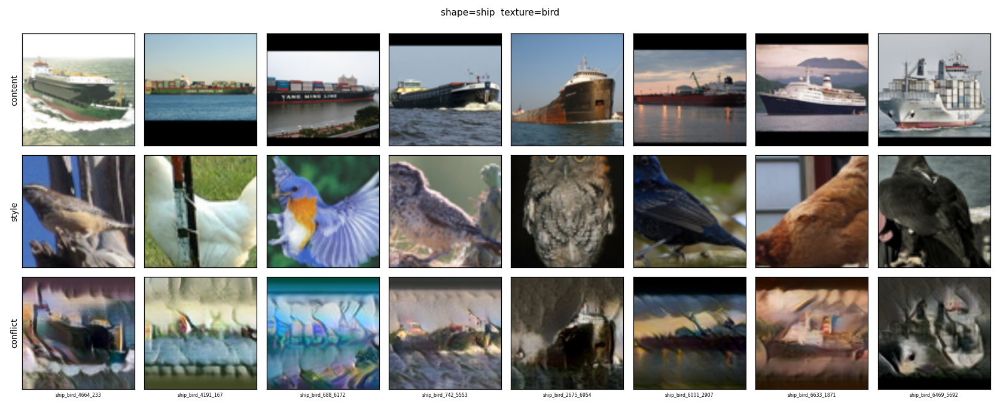

results/cue_conflicts/contact_sheets/ship_to_monkey.png


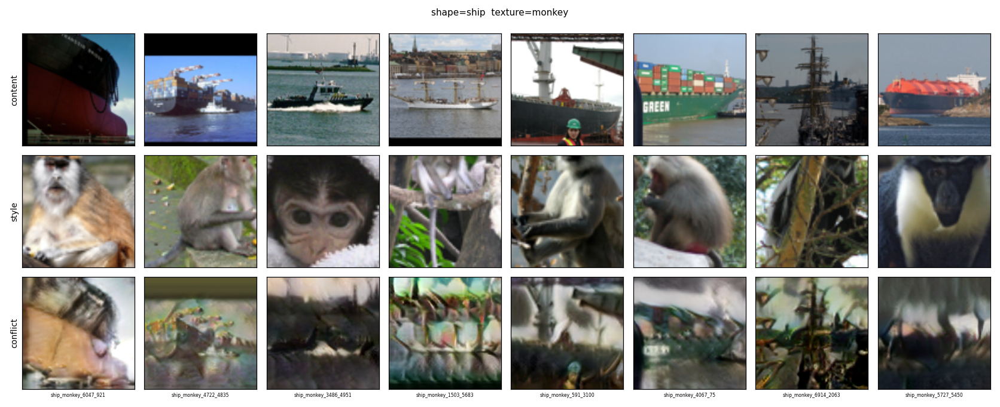

results/cue_conflicts/contact_sheets/truck_to_airplane.png


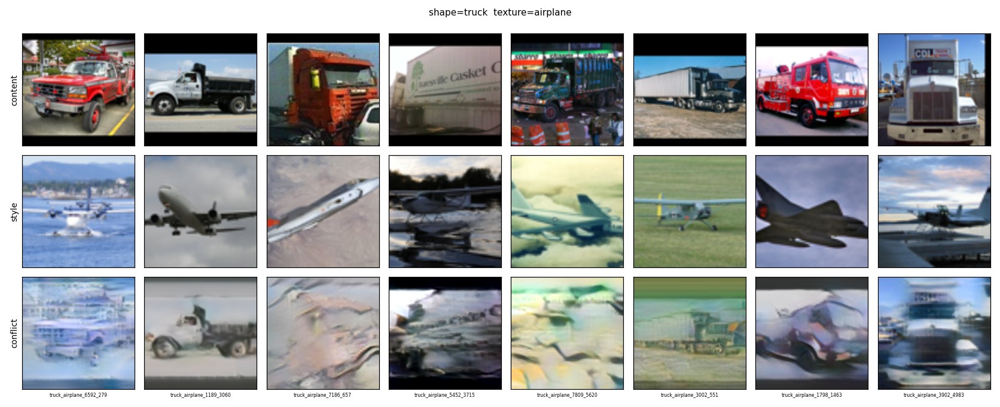

In [6]:
import glob
from IPython.display import Image, display
for f in sorted(glob.glob('results/cue_conflicts/contact_sheets/*.png')):
    print(f); display(Image(f, width=900))

## 3. All evaluations, t-SNE and figures

In [7]:
!python scripts/run_task1.py --config configs/config.yaml

Using device: cuda
Building the common clean images and colour / shuffle interventions ...

=== Backbone: resnet50 ===
Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100% 97.8M/97.8M [00:00<00:00, 128MB/s]
Extracting frozen train/val features ...
  [early stop] epoch 12, best epoch 7, best val acc = 0.9740
Best val acc 0.9740 at epoch 7

=== Backbone: vit_b_16 ===
Downloading: "https://download.pytorch.org/models/vit_b_16-c867db91.pth" to /root/.cache/torch/hub/checkpoints/vit_b_16-c867db91.pth
100% 330M/330M [00:04<00:00, 86.4MB/s]
Extracting frozen train/val features ...
  [early stop] epoch 10, best epoch 5, best val acc = 0.9790
Best val acc 0.9790 at epoch 5

=== Backbone: clip_vit_b32 ===

open_clip_model.safetensors: downloading bytes:  25% 154M/605M [00:01<00:02, 179MB/s, 13.2MB/s  ]
open_clip_model.safetensors: downloading bytes:  58% 350M/605M [00:02<00:01, 135MB/s, 29.2MB/s  ]
open_clip_mod

# Task 1 summary tables

## Clean, colour and patch-shuffle (accuracy % / consistency %)

| Model | Clean acc | Clean F1 | Clean conf | Gray acc (Δ) | Gray cons | Hue acc (Δ) | Hue cons | Shuffle acc (Δ) | Shuffle cons |
|---|---|---|---|---|---|---|---|---|---|
| ResNet-50 | 97.6 | 97.6 | 0.962 | 94.0 (-3.6) | 95.2 | 94.8 (-2.8) | 96.2 | 89.6 (-8.0) | 90.6 |
| ViT-B/16 | 97.6 | 97.6 | 0.973 | 94.8 (-2.8) | 97.2 | 93.6 (-4.0) | 95.2 | 90.8 (-6.8) | 92.4 |
| CLIP head | 97.4 | 97.4 | 0.654 | 93.6 (-3.8) | 94.0 | 92.8 (-4.6) | 94.0 | 83.4 (-14.0) | 84.0 |
| CLIP zero-shot | 96.4 | 96.4 | 0.936 | 91.8 (-4.6) | 92.2 | 92.8 (-3.6) | 93.4 | 81.4 (-15.0) | 82.6 |

## Cue conflict

| Model | N shape | N texture | N other | Shape bias % | Coverage % |
|---|---|---|---|---|---|
| ResNet-50 | 69 | 57 | 74 | 54.8 | 63.0 |
| ViT-B/16 | 104 | 27 | 69 | 79.4 | 65.5 |
| CLIP head | 121 | 19 | 60 | 86.4 | 70.0 |
| CLIP zero-shot | 124 | 21 | 55 | 85.5 | 72.5 |

Generation: backend=adain_decoder, style 

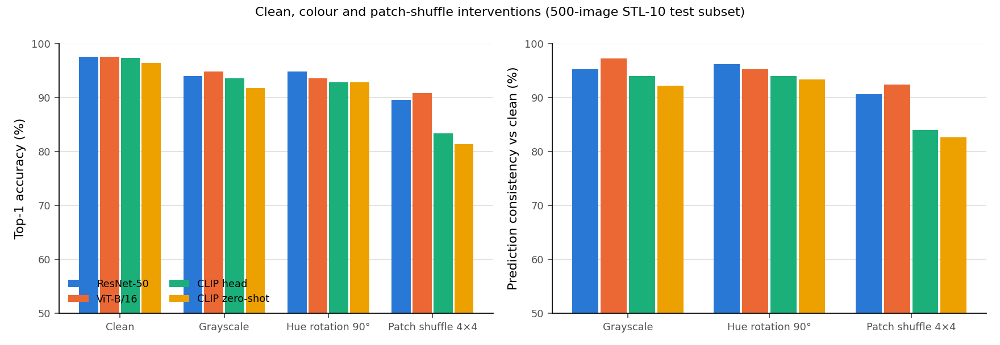

results/plots/fig_cue_conflict_examples.png


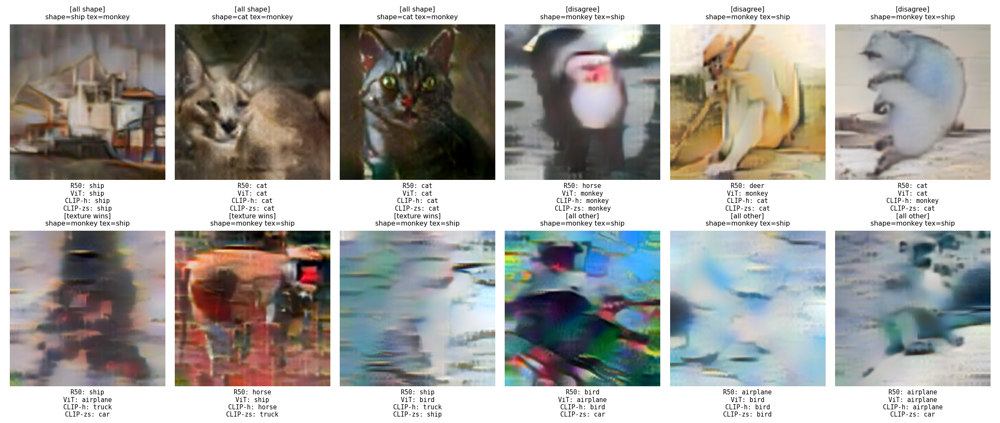

results/plots/fig_representation_stability.png


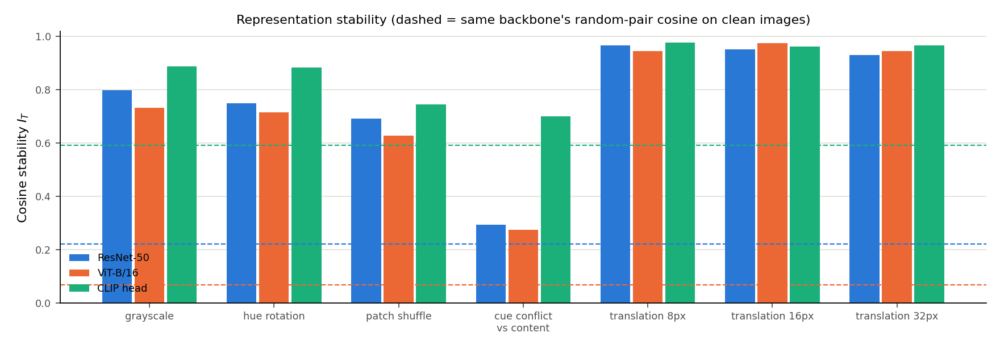

results/plots/fig_shape_texture.png


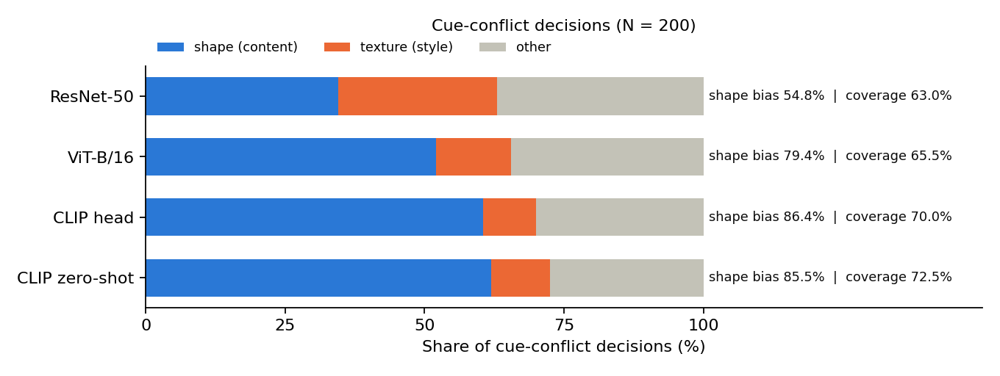

results/plots/fig_translation_curve.png


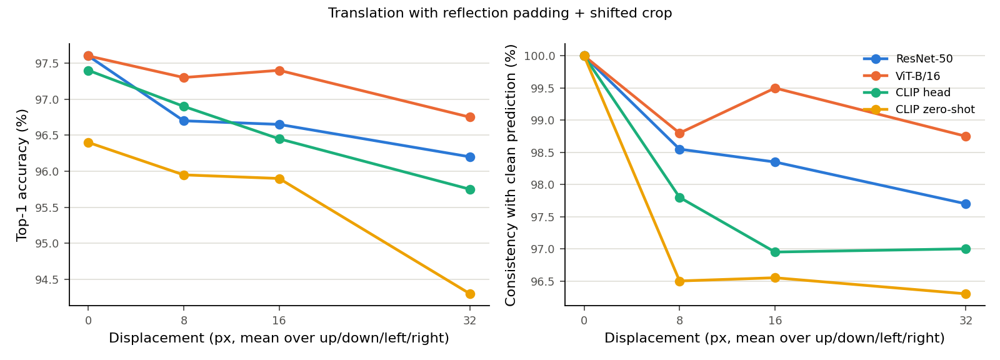

In [8]:
print(open('results/summary_tables.md').read())
for f in sorted(glob.glob('results/plots/fig_*.png')):
    print(f); display(Image(f, width=1000))

Everything is already on Drive in `PA1_v2/task1_results`.